# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [ ]:
# run this once to unzip the file
!unzip processed-celeba-small.zip

In [1]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor
from torchvision import transforms
import os
import tests
from torch import nn
import torch.nn.functional as F
from torch.nn import BCEWithLogitsLoss


In [2]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [3]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transform = transforms.Compose([
      transforms.Resize(size),
      transforms.ToTensor(),
      transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
  ])


    return transform

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [4]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transform: Callable = None, 
                 extension: str = '.jpg'):
        # TODO: implement the init method
        self.directory = directory
        self.transform = transform
        self.extension = extension
        self.image_paths = [os.path.join(directory, f) for f in os.listdir(directory) if f.endswith(extension)]

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return len(self.image_paths)

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        image_path = self.image_paths[index]
        image = Image.open(image_path)
        image = image.convert('RGB')
        if self.transform:
            image = self.transform(image)

        return image

In [5]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

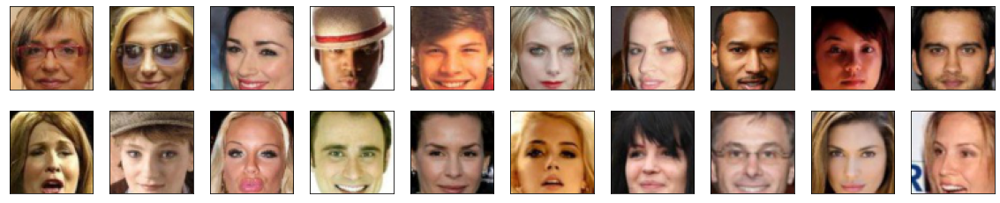

In [6]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [7]:
from torch.nn import Module

In [8]:
import torch
from torch import nn

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(

            # Input: 64x64x3
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # 32x32x64
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # 16x16x128
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # 8x8x256
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # 4x4x512
            #nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Flatten(),
            nn.Linear(64*4*4*4*2, 1),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        output = self.model(x)
        output = output.unsqueeze(2).unsqueeze(3)

        return output

In [9]:
Discriminator()

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (4): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Flatten(start_dim=1, end_dim=-1)
    (9): Linear(in_features=8192, out_features=1, bias=True)
  )
)

In [10]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [11]:

class Generator(nn.Module):

    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        conv_dim = 64

        self.deconv0 = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, conv_dim * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(conv_dim * 8),
            nn.ReLU()
        )

        self.deconv1 = nn.Sequential(
            nn.ConvTranspose2d(conv_dim * 8, conv_dim * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(conv_dim * 4),
            nn.ReLU()
        )

        self.deconv2 = nn.Sequential(
            nn.ConvTranspose2d(conv_dim * 4, conv_dim * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(conv_dim * 2),
            nn.ReLU()
        )

        self.deconv3 = nn.Sequential(
            nn.ConvTranspose2d(conv_dim * 2, conv_dim, 4, 2, 1, bias=False),
            nn.BatchNorm2d(conv_dim),
            nn.ReLU()
        )

        self.deconv4 = nn.ConvTranspose2d(conv_dim, 3, 4, 2, 1, bias=False)
        self.last_activation = nn.Tanh()

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.deconv0(x)
        x = self.deconv1(x)
        x = self.deconv2(x)
        x = self.deconv3(x)
        x = self.deconv4(x)
        x = self.last_activation(x)
        return x

In [12]:
print(Generator(128))

Generator(
  (deconv0): Sequential(
    (0): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (deconv1): Sequential(
    (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (deconv2): Sequential(
    (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (deconv3): Sequential(
    (0): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (deconv4): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padd

In [13]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [14]:
import torch.optim as optim


def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    g_optimizer = optim.Adam(generator.parameters(),lr = 0.0002,betas = (0.5,0.999))
    d_optimizer = optim.Adam(discriminator.parameters(),lr = 0.0002,betas = (0.5,0.999))
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [15]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss
    loss = -fake_logits.mean()


    return loss
     

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [16]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss
    real_loss = -real_logits.mean()
    fake_loss = fake_logits.mean()
    loss=real_loss + fake_loss
    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [17]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    #gp = 0
    # TODO (Optional): implement the gradient penalty
    alpha = torch.rand(real_samples.shape).to(device)
    x_hat = (alpha*real_samples + (1 - alpha)*fake_samples).requires_grad_(True)
    
    # calculate the gradient
    pred = discriminator(x_hat)
    grad = torch.autograd.grad(pred, x_hat , 
                               grad_outputs=torch.ones_like(pred), 
                               create_graph=True)[0]
    
    # calculate the norm and the final penalty
    norm = torch.norm(grad.view(-1), 2)
    gp = ((norm - 1)**2).mean()    
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [18]:
def generator_step(batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    g_optimizer.zero_grad()      
    noise = torch.randn(batch_size, latent_dim, 1, 1).float().to(device)
    fake_images = generator(noise)
    D_fake = discriminator(fake_images)
    g_loss = generator_loss(D_fake) # use real loss to flip labels
    g_loss.backward()
    g_optimizer.step() 
    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    lambda_val = 7
    d_optimizer.zero_grad()        
    D_real = discriminator(real_images)        
    noise = torch.randn(batch_size, latent_dim, 1, 1).float().to(device)
    fake_images = generator(noise) 
    D_fake = discriminator(fake_images.detach())
    d_loss = discriminator_loss(D_real, D_fake)        
    gp = gradient_penalty(discriminator, real_images, fake_images)
    d_loss = d_loss + gp*lambda_val
    d_loss.backward()
    d_optimizer.step()
    return {'loss': d_loss, 'gp': gp}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [19]:
from datetime import datetime

In [20]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 50

# number of images in each batch
batch_size = 64

In [21]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [22]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2024-08-05 22:57:25 | Ep [1/50] | Bch 0/509 | d_lss: 5.5015 | g_lss: 0.0178
2024-08-05 22:57:34 | Ep [1/50] | Bch 50/509 | d_lss: -1.5109 | g_lss: 0.5362
2024-08-05 22:57:42 | Ep [1/50] | Bch 100/509 | d_lss: -0.4479 | g_lss: 0.0673
2024-08-05 22:57:50 | Ep [1/50] | Bch 150/509 | d_lss: -0.5404 | g_lss: 0.4938
2024-08-05 22:57:59 | Ep [1/50] | Bch 200/509 | d_lss: -0.2869 | g_lss: 0.7919
2024-08-05 22:58:07 | Ep [1/50] | Bch 250/509 | d_lss: -0.6351 | g_lss: -0.5714
2024-08-05 22:58:16 | Ep [1/50] | Bch 300/509 | d_lss: -0.5330 | g_lss: 0.4214
2024-08-05 22:58:24 | Ep [1/50] | Bch 350/509 | d_lss: -0.5869 | g_lss: 0.3329
2024-08-05 22:58:33 | Ep [1/50] | Bch 400/509 | d_lss: -0.3849 | g_lss: 0.5510
2024-08-05 22:58:42 | Ep [1/50] | Bch 450/509 | d_lss: -0.4251 | g_lss: 0.7768
2024-08-05 22:58:50 | Ep [1/50] | Bch 500/509 | d_lss: -0.4629 | g_lss: 0.0573


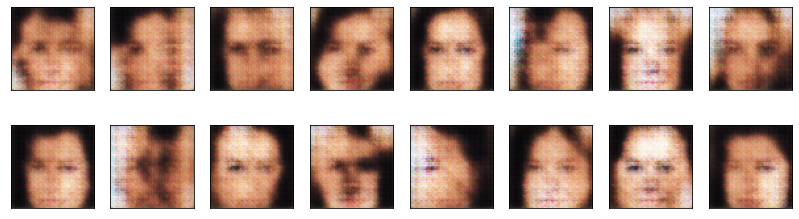

2024-08-05 22:58:56 | Ep [2/50] | Bch 0/509 | d_lss: -0.4140 | g_lss: -0.8324
2024-08-05 22:59:05 | Ep [2/50] | Bch 50/509 | d_lss: -0.4130 | g_lss: 2.7085
2024-08-05 22:59:13 | Ep [2/50] | Bch 100/509 | d_lss: -1.0735 | g_lss: -0.8581
2024-08-05 22:59:22 | Ep [2/50] | Bch 150/509 | d_lss: -0.3992 | g_lss: -1.5588
2024-08-05 22:59:31 | Ep [2/50] | Bch 200/509 | d_lss: -0.7457 | g_lss: -0.0945
2024-08-05 22:59:39 | Ep [2/50] | Bch 250/509 | d_lss: -0.6814 | g_lss: 0.9026
2024-08-05 22:59:48 | Ep [2/50] | Bch 300/509 | d_lss: -0.6232 | g_lss: -0.5352
2024-08-05 22:59:56 | Ep [2/50] | Bch 350/509 | d_lss: -0.6633 | g_lss: -1.6392
2024-08-05 23:00:05 | Ep [2/50] | Bch 400/509 | d_lss: -0.7541 | g_lss: 1.4957
2024-08-05 23:00:13 | Ep [2/50] | Bch 450/509 | d_lss: -0.5306 | g_lss: 0.0471
2024-08-05 23:00:21 | Ep [2/50] | Bch 500/509 | d_lss: -0.5425 | g_lss: -2.2263


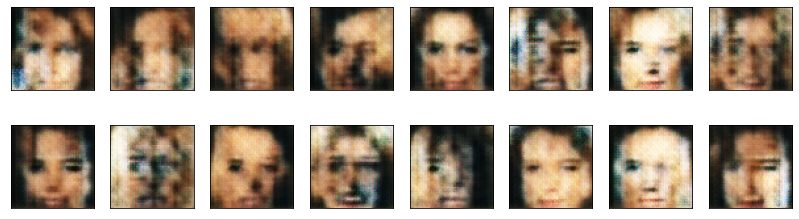

2024-08-05 23:00:26 | Ep [3/50] | Bch 0/509 | d_lss: -0.6685 | g_lss: 2.5173
2024-08-05 23:00:35 | Ep [3/50] | Bch 50/509 | d_lss: -0.5192 | g_lss: -0.3733
2024-08-05 23:00:43 | Ep [3/50] | Bch 100/509 | d_lss: -0.4116 | g_lss: -1.6126
2024-08-05 23:00:52 | Ep [3/50] | Bch 150/509 | d_lss: -0.4902 | g_lss: -1.0698
2024-08-05 23:01:00 | Ep [3/50] | Bch 200/509 | d_lss: -0.5602 | g_lss: -0.7225
2024-08-05 23:01:09 | Ep [3/50] | Bch 250/509 | d_lss: -0.7978 | g_lss: -0.6821
2024-08-05 23:01:17 | Ep [3/50] | Bch 300/509 | d_lss: -0.4443 | g_lss: -1.1783
2024-08-05 23:01:26 | Ep [3/50] | Bch 350/509 | d_lss: -0.5501 | g_lss: 1.1343
2024-08-05 23:01:34 | Ep [3/50] | Bch 400/509 | d_lss: -0.4431 | g_lss: 0.2021
2024-08-05 23:01:42 | Ep [3/50] | Bch 450/509 | d_lss: -0.2662 | g_lss: -0.0340
2024-08-05 23:01:51 | Ep [3/50] | Bch 500/509 | d_lss: -0.4592 | g_lss: 0.4856


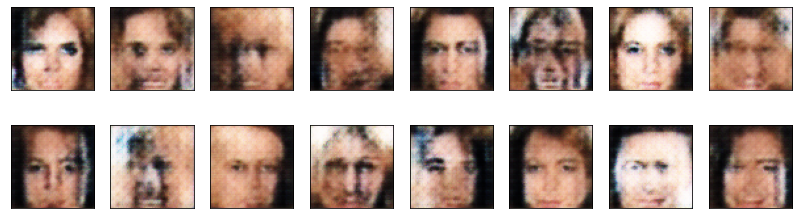

2024-08-05 23:01:56 | Ep [4/50] | Bch 0/509 | d_lss: -0.4767 | g_lss: -0.2484
2024-08-05 23:02:04 | Ep [4/50] | Bch 50/509 | d_lss: -0.0398 | g_lss: -2.0281
2024-08-05 23:02:12 | Ep [4/50] | Bch 100/509 | d_lss: -0.2875 | g_lss: -0.0523
2024-08-05 23:02:21 | Ep [4/50] | Bch 150/509 | d_lss: -0.2514 | g_lss: 0.2980
2024-08-05 23:02:30 | Ep [4/50] | Bch 200/509 | d_lss: -0.2642 | g_lss: -0.3318
2024-08-05 23:02:38 | Ep [4/50] | Bch 250/509 | d_lss: -0.3596 | g_lss: -0.9466
2024-08-05 23:02:47 | Ep [4/50] | Bch 300/509 | d_lss: -0.3584 | g_lss: 1.7978
2024-08-05 23:02:55 | Ep [4/50] | Bch 350/509 | d_lss: -0.3157 | g_lss: -0.5970
2024-08-05 23:03:04 | Ep [4/50] | Bch 400/509 | d_lss: -0.4410 | g_lss: -1.4000
2024-08-05 23:03:12 | Ep [4/50] | Bch 450/509 | d_lss: -0.4955 | g_lss: -0.0619
2024-08-05 23:03:21 | Ep [4/50] | Bch 500/509 | d_lss: -0.2213 | g_lss: 0.6780


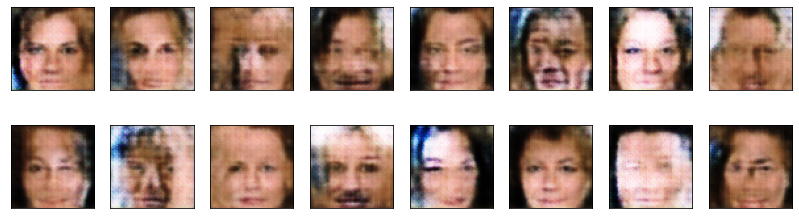

2024-08-05 23:03:25 | Ep [5/50] | Bch 0/509 | d_lss: -0.2494 | g_lss: -0.1640
2024-08-05 23:03:34 | Ep [5/50] | Bch 50/509 | d_lss: -0.5099 | g_lss: 0.6775
2024-08-05 23:03:42 | Ep [5/50] | Bch 100/509 | d_lss: -0.3577 | g_lss: 0.2563
2024-08-05 23:03:51 | Ep [5/50] | Bch 150/509 | d_lss: -0.3202 | g_lss: 0.0711
2024-08-05 23:03:59 | Ep [5/50] | Bch 200/509 | d_lss: -0.2587 | g_lss: -0.6356
2024-08-05 23:04:08 | Ep [5/50] | Bch 250/509 | d_lss: -0.3064 | g_lss: -0.1404
2024-08-05 23:04:17 | Ep [5/50] | Bch 300/509 | d_lss: -0.3865 | g_lss: 1.6523
2024-08-05 23:04:25 | Ep [5/50] | Bch 350/509 | d_lss: -0.3247 | g_lss: -0.6403
2024-08-05 23:04:34 | Ep [5/50] | Bch 400/509 | d_lss: -0.4798 | g_lss: 0.5745
2024-08-05 23:04:42 | Ep [5/50] | Bch 450/509 | d_lss: -0.2959 | g_lss: 0.8360
2024-08-05 23:04:51 | Ep [5/50] | Bch 500/509 | d_lss: -0.2504 | g_lss: -0.0204


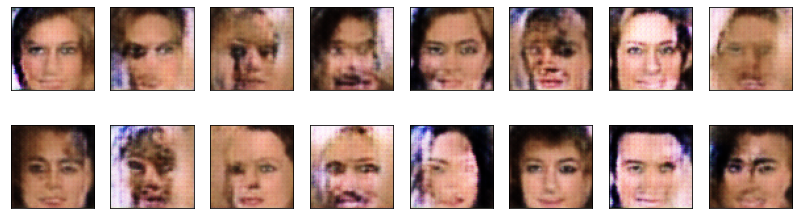

2024-08-05 23:04:56 | Ep [6/50] | Bch 0/509 | d_lss: -0.1899 | g_lss: 0.5209
2024-08-05 23:05:04 | Ep [6/50] | Bch 50/509 | d_lss: -0.3248 | g_lss: 1.2343
2024-08-05 23:05:13 | Ep [6/50] | Bch 100/509 | d_lss: -0.3386 | g_lss: 0.1189
2024-08-05 23:05:21 | Ep [6/50] | Bch 150/509 | d_lss: -0.2588 | g_lss: 0.3357
2024-08-05 23:05:30 | Ep [6/50] | Bch 200/509 | d_lss: -0.3434 | g_lss: -0.0066
2024-08-05 23:05:39 | Ep [6/50] | Bch 250/509 | d_lss: -0.3791 | g_lss: -0.9770
2024-08-05 23:05:47 | Ep [6/50] | Bch 300/509 | d_lss: -0.2518 | g_lss: -0.5547
2024-08-05 23:05:55 | Ep [6/50] | Bch 350/509 | d_lss: -0.4403 | g_lss: 1.5619
2024-08-05 23:06:04 | Ep [6/50] | Bch 400/509 | d_lss: -0.3136 | g_lss: 0.1000
2024-08-05 23:06:12 | Ep [6/50] | Bch 450/509 | d_lss: -0.2724 | g_lss: 1.4882
2024-08-05 23:06:21 | Ep [6/50] | Bch 500/509 | d_lss: -0.4018 | g_lss: 2.2397


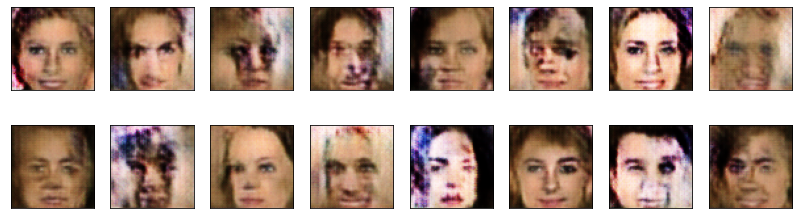

2024-08-05 23:06:25 | Ep [7/50] | Bch 0/509 | d_lss: -0.3346 | g_lss: -1.1455
2024-08-05 23:06:33 | Ep [7/50] | Bch 50/509 | d_lss: -0.2510 | g_lss: -0.6978
2024-08-05 23:06:42 | Ep [7/50] | Bch 100/509 | d_lss: -0.3593 | g_lss: -0.0943
2024-08-05 23:06:50 | Ep [7/50] | Bch 150/509 | d_lss: -0.2341 | g_lss: -0.7253
2024-08-05 23:06:59 | Ep [7/50] | Bch 200/509 | d_lss: -0.2227 | g_lss: 0.8682
2024-08-05 23:07:07 | Ep [7/50] | Bch 250/509 | d_lss: -0.1789 | g_lss: -0.4715
2024-08-05 23:07:16 | Ep [7/50] | Bch 300/509 | d_lss: -0.3582 | g_lss: 0.5695
2024-08-05 23:07:24 | Ep [7/50] | Bch 350/509 | d_lss: -0.2934 | g_lss: 0.1159
2024-08-05 23:07:33 | Ep [7/50] | Bch 400/509 | d_lss: -0.1890 | g_lss: -0.7264
2024-08-05 23:07:41 | Ep [7/50] | Bch 450/509 | d_lss: -0.3459 | g_lss: 0.8022
2024-08-05 23:07:50 | Ep [7/50] | Bch 500/509 | d_lss: -0.3618 | g_lss: -0.0230


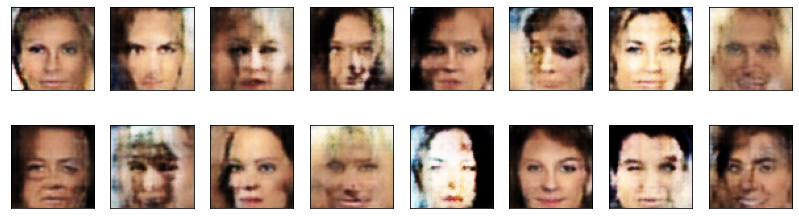

2024-08-05 23:07:55 | Ep [8/50] | Bch 0/509 | d_lss: -0.1450 | g_lss: 0.4741
2024-08-05 23:08:03 | Ep [8/50] | Bch 50/509 | d_lss: -0.2584 | g_lss: -0.0881
2024-08-05 23:08:12 | Ep [8/50] | Bch 100/509 | d_lss: -0.1646 | g_lss: 1.0367
2024-08-05 23:08:20 | Ep [8/50] | Bch 150/509 | d_lss: -0.1092 | g_lss: 0.4626
2024-08-05 23:08:29 | Ep [8/50] | Bch 200/509 | d_lss: -0.4009 | g_lss: 0.3701
2024-08-05 23:08:37 | Ep [8/50] | Bch 250/509 | d_lss: -0.4869 | g_lss: 1.4088
2024-08-05 23:08:46 | Ep [8/50] | Bch 300/509 | d_lss: -0.2978 | g_lss: -0.0118
2024-08-05 23:08:54 | Ep [8/50] | Bch 350/509 | d_lss: -0.4965 | g_lss: 2.3110
2024-08-05 23:09:03 | Ep [8/50] | Bch 400/509 | d_lss: -0.0837 | g_lss: -1.5044
2024-08-05 23:09:11 | Ep [8/50] | Bch 450/509 | d_lss: -0.4500 | g_lss: 0.7601
2024-08-05 23:09:19 | Ep [8/50] | Bch 500/509 | d_lss: -0.3126 | g_lss: 0.1479


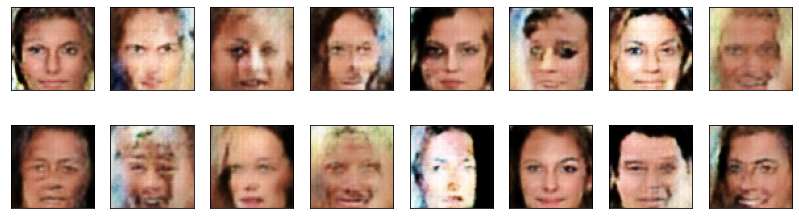

2024-08-05 23:09:24 | Ep [9/50] | Bch 0/509 | d_lss: -0.1419 | g_lss: -0.4760
2024-08-05 23:09:32 | Ep [9/50] | Bch 50/509 | d_lss: -0.3275 | g_lss: -0.1409
2024-08-05 23:09:41 | Ep [9/50] | Bch 100/509 | d_lss: -0.3490 | g_lss: -0.2514
2024-08-05 23:09:49 | Ep [9/50] | Bch 150/509 | d_lss: -0.1416 | g_lss: 0.7496
2024-08-05 23:09:58 | Ep [9/50] | Bch 200/509 | d_lss: -0.2206 | g_lss: -0.2934
2024-08-05 23:10:06 | Ep [9/50] | Bch 250/509 | d_lss: -0.3240 | g_lss: 0.0877
2024-08-05 23:10:15 | Ep [9/50] | Bch 300/509 | d_lss: -0.1103 | g_lss: -0.8630
2024-08-05 23:10:23 | Ep [9/50] | Bch 350/509 | d_lss: -0.2311 | g_lss: -1.5809
2024-08-05 23:10:32 | Ep [9/50] | Bch 400/509 | d_lss: -0.2352 | g_lss: 0.2174
2024-08-05 23:10:41 | Ep [9/50] | Bch 450/509 | d_lss: -0.4256 | g_lss: -1.0400
2024-08-05 23:10:49 | Ep [9/50] | Bch 500/509 | d_lss: -0.2287 | g_lss: -1.1201


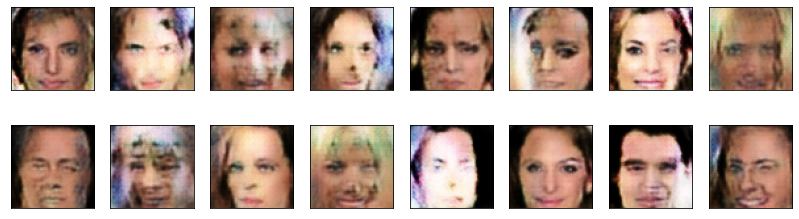

2024-08-05 23:10:54 | Ep [10/50] | Bch 0/509 | d_lss: -0.1975 | g_lss: 0.5640
2024-08-05 23:11:03 | Ep [10/50] | Bch 50/509 | d_lss: -0.2115 | g_lss: 1.0635
2024-08-05 23:11:11 | Ep [10/50] | Bch 100/509 | d_lss: -0.1776 | g_lss: 0.4257
2024-08-05 23:11:20 | Ep [10/50] | Bch 150/509 | d_lss: -0.2777 | g_lss: 0.2630
2024-08-05 23:11:28 | Ep [10/50] | Bch 200/509 | d_lss: -0.2347 | g_lss: -0.2530
2024-08-05 23:11:37 | Ep [10/50] | Bch 250/509 | d_lss: -0.1665 | g_lss: 0.1142
2024-08-05 23:11:45 | Ep [10/50] | Bch 300/509 | d_lss: -0.0880 | g_lss: 1.9498
2024-08-05 23:11:54 | Ep [10/50] | Bch 350/509 | d_lss: -0.2781 | g_lss: -0.8269
2024-08-05 23:12:02 | Ep [10/50] | Bch 400/509 | d_lss: -0.1884 | g_lss: 1.3967
2024-08-05 23:12:11 | Ep [10/50] | Bch 450/509 | d_lss: -0.0745 | g_lss: -0.9180
2024-08-05 23:12:19 | Ep [10/50] | Bch 500/509 | d_lss: -0.1877 | g_lss: -0.5048


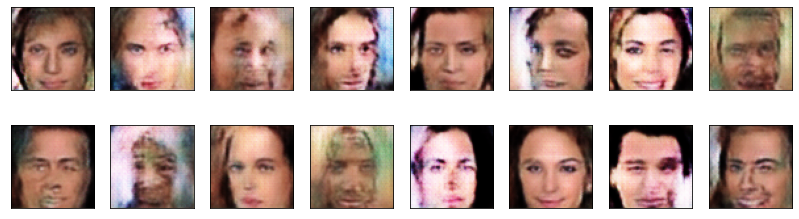

2024-08-05 23:12:25 | Ep [11/50] | Bch 0/509 | d_lss: -0.1961 | g_lss: 0.1234
2024-08-05 23:12:33 | Ep [11/50] | Bch 50/509 | d_lss: -0.2935 | g_lss: -1.2967
2024-08-05 23:12:42 | Ep [11/50] | Bch 100/509 | d_lss: -0.2946 | g_lss: -1.0755
2024-08-05 23:12:50 | Ep [11/50] | Bch 150/509 | d_lss: -0.1868 | g_lss: 0.3372
2024-08-05 23:12:59 | Ep [11/50] | Bch 200/509 | d_lss: -0.1356 | g_lss: 0.9577
2024-08-05 23:13:07 | Ep [11/50] | Bch 250/509 | d_lss: -0.2217 | g_lss: -2.0170
2024-08-05 23:13:16 | Ep [11/50] | Bch 300/509 | d_lss: -0.0021 | g_lss: 2.1826
2024-08-05 23:13:24 | Ep [11/50] | Bch 350/509 | d_lss: -0.3431 | g_lss: 0.1232
2024-08-05 23:13:33 | Ep [11/50] | Bch 400/509 | d_lss: -0.3749 | g_lss: -0.9022
2024-08-05 23:13:41 | Ep [11/50] | Bch 450/509 | d_lss: -0.0870 | g_lss: 0.4326
2024-08-05 23:13:50 | Ep [11/50] | Bch 500/509 | d_lss: -0.2210 | g_lss: -0.1706


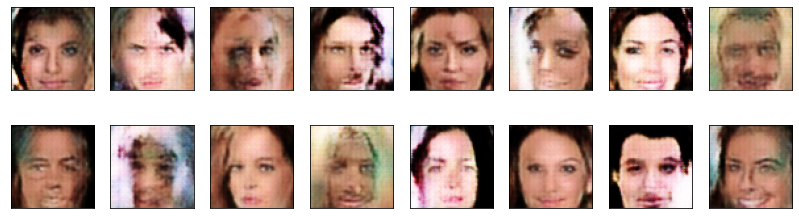

2024-08-05 23:13:55 | Ep [12/50] | Bch 0/509 | d_lss: -0.0199 | g_lss: 2.0964
2024-08-05 23:14:03 | Ep [12/50] | Bch 50/509 | d_lss: -0.2719 | g_lss: 0.0561
2024-08-05 23:14:12 | Ep [12/50] | Bch 100/509 | d_lss: -0.1958 | g_lss: 0.1935
2024-08-05 23:14:20 | Ep [12/50] | Bch 150/509 | d_lss: -0.1861 | g_lss: -0.4181
2024-08-05 23:14:29 | Ep [12/50] | Bch 200/509 | d_lss: -0.3409 | g_lss: 0.8569
2024-08-05 23:14:38 | Ep [12/50] | Bch 250/509 | d_lss: -0.2586 | g_lss: 0.7579
2024-08-05 23:14:46 | Ep [12/50] | Bch 300/509 | d_lss: -0.1906 | g_lss: -0.1592
2024-08-05 23:14:55 | Ep [12/50] | Bch 350/509 | d_lss: -0.1285 | g_lss: -0.7525
2024-08-05 23:15:03 | Ep [12/50] | Bch 400/509 | d_lss: -0.0700 | g_lss: 0.5000
2024-08-05 23:15:12 | Ep [12/50] | Bch 450/509 | d_lss: -0.1965 | g_lss: 0.3860
2024-08-05 23:15:20 | Ep [12/50] | Bch 500/509 | d_lss: -0.2527 | g_lss: 0.8085


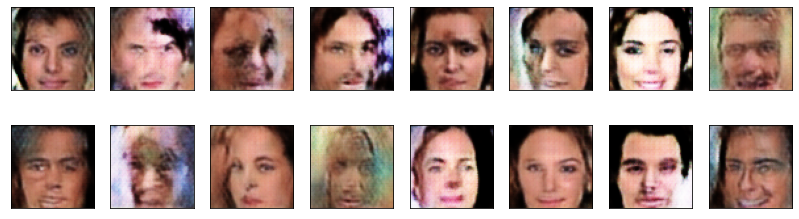

2024-08-05 23:15:26 | Ep [13/50] | Bch 0/509 | d_lss: -0.2616 | g_lss: -0.3752
2024-08-05 23:15:34 | Ep [13/50] | Bch 50/509 | d_lss: -0.0674 | g_lss: 1.1206
2024-08-05 23:15:43 | Ep [13/50] | Bch 100/509 | d_lss: -0.1012 | g_lss: -0.6765
2024-08-05 23:15:51 | Ep [13/50] | Bch 150/509 | d_lss: -0.2363 | g_lss: 1.0863
2024-08-05 23:16:00 | Ep [13/50] | Bch 200/509 | d_lss: -0.3572 | g_lss: -2.3863
2024-08-05 23:16:08 | Ep [13/50] | Bch 250/509 | d_lss: -0.1303 | g_lss: 0.2511
2024-08-05 23:16:17 | Ep [13/50] | Bch 300/509 | d_lss: -0.1541 | g_lss: -0.7635
2024-08-05 23:16:25 | Ep [13/50] | Bch 350/509 | d_lss: -0.0264 | g_lss: 0.1373
2024-08-05 23:16:34 | Ep [13/50] | Bch 400/509 | d_lss: -0.2304 | g_lss: 0.1292
2024-08-05 23:16:43 | Ep [13/50] | Bch 450/509 | d_lss: -0.1594 | g_lss: -0.0159
2024-08-05 23:16:51 | Ep [13/50] | Bch 500/509 | d_lss: -0.2179 | g_lss: -1.0647


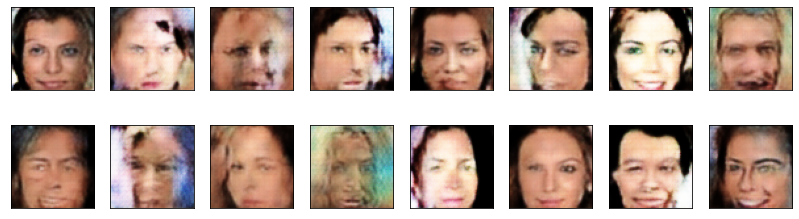

2024-08-05 23:16:56 | Ep [14/50] | Bch 0/509 | d_lss: -0.1508 | g_lss: 1.4434
2024-08-05 23:17:05 | Ep [14/50] | Bch 50/509 | d_lss: -0.2149 | g_lss: 0.0141
2024-08-05 23:17:13 | Ep [14/50] | Bch 100/509 | d_lss: -0.2255 | g_lss: 1.8529
2024-08-05 23:17:22 | Ep [14/50] | Bch 150/509 | d_lss: -0.1460 | g_lss: 1.8035
2024-08-05 23:17:31 | Ep [14/50] | Bch 200/509 | d_lss: -0.1734 | g_lss: -0.2363
2024-08-05 23:17:39 | Ep [14/50] | Bch 250/509 | d_lss: -0.1616 | g_lss: 0.1901
2024-08-05 23:17:48 | Ep [14/50] | Bch 300/509 | d_lss: -0.3631 | g_lss: -1.7837
2024-08-05 23:17:56 | Ep [14/50] | Bch 350/509 | d_lss: -0.0803 | g_lss: 0.2572
2024-08-05 23:18:05 | Ep [14/50] | Bch 400/509 | d_lss: -0.1780 | g_lss: 1.2231
2024-08-05 23:18:13 | Ep [14/50] | Bch 450/509 | d_lss: -0.2280 | g_lss: -1.1892
2024-08-05 23:18:21 | Ep [14/50] | Bch 500/509 | d_lss: -0.1163 | g_lss: -0.6685


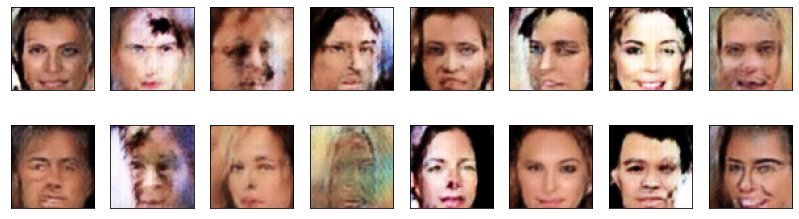

2024-08-05 23:18:27 | Ep [15/50] | Bch 0/509 | d_lss: -0.1650 | g_lss: 0.9590
2024-08-05 23:18:36 | Ep [15/50] | Bch 50/509 | d_lss: -0.2561 | g_lss: 1.0781
2024-08-05 23:18:44 | Ep [15/50] | Bch 100/509 | d_lss: -0.1988 | g_lss: -0.1702
2024-08-05 23:18:53 | Ep [15/50] | Bch 150/509 | d_lss: -0.1444 | g_lss: -0.7391
2024-08-05 23:19:01 | Ep [15/50] | Bch 200/509 | d_lss: -0.2771 | g_lss: -0.6167
2024-08-05 23:19:10 | Ep [15/50] | Bch 250/509 | d_lss: -0.1958 | g_lss: -0.1116
2024-08-05 23:19:18 | Ep [15/50] | Bch 300/509 | d_lss: -0.1633 | g_lss: -0.3668
2024-08-05 23:19:27 | Ep [15/50] | Bch 350/509 | d_lss: -0.1754 | g_lss: -0.1549
2024-08-05 23:19:35 | Ep [15/50] | Bch 400/509 | d_lss: -0.1652 | g_lss: -0.9938
2024-08-05 23:19:44 | Ep [15/50] | Bch 450/509 | d_lss: -0.1370 | g_lss: 0.4406
2024-08-05 23:19:52 | Ep [15/50] | Bch 500/509 | d_lss: -0.2162 | g_lss: 0.3604


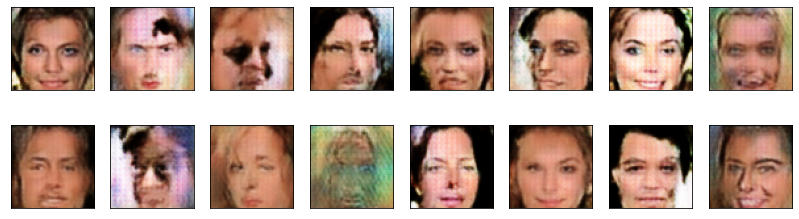

2024-08-05 23:19:58 | Ep [16/50] | Bch 0/509 | d_lss: -0.2183 | g_lss: -0.7643
2024-08-05 23:20:06 | Ep [16/50] | Bch 50/509 | d_lss: -0.2005 | g_lss: 0.7380
2024-08-05 23:20:15 | Ep [16/50] | Bch 100/509 | d_lss: -0.1031 | g_lss: 1.2078
2024-08-05 23:20:23 | Ep [16/50] | Bch 150/509 | d_lss: -0.1619 | g_lss: -0.2611
2024-08-05 23:20:32 | Ep [16/50] | Bch 200/509 | d_lss: -0.1102 | g_lss: -0.7549
2024-08-05 23:20:40 | Ep [16/50] | Bch 250/509 | d_lss: -0.3132 | g_lss: 0.5297
2024-08-05 23:20:49 | Ep [16/50] | Bch 300/509 | d_lss: 0.0541 | g_lss: 2.0013
2024-08-05 23:20:57 | Ep [16/50] | Bch 350/509 | d_lss: -0.1890 | g_lss: -0.8981
2024-08-05 23:21:06 | Ep [16/50] | Bch 400/509 | d_lss: -0.1107 | g_lss: 0.7631
2024-08-05 23:21:14 | Ep [16/50] | Bch 450/509 | d_lss: -0.0535 | g_lss: 0.9264
2024-08-05 23:21:22 | Ep [16/50] | Bch 500/509 | d_lss: -0.1568 | g_lss: -0.2296


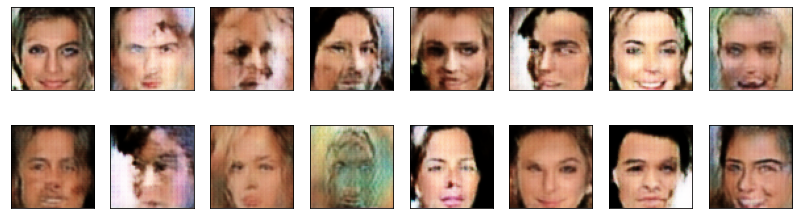

2024-08-05 23:21:27 | Ep [17/50] | Bch 0/509 | d_lss: -0.1927 | g_lss: 1.2342
2024-08-05 23:21:36 | Ep [17/50] | Bch 50/509 | d_lss: -0.1910 | g_lss: 0.6739
2024-08-05 23:21:44 | Ep [17/50] | Bch 100/509 | d_lss: -0.0277 | g_lss: -1.1765
2024-08-05 23:21:53 | Ep [17/50] | Bch 150/509 | d_lss: -0.0992 | g_lss: -0.5295
2024-08-05 23:22:01 | Ep [17/50] | Bch 200/509 | d_lss: -0.2921 | g_lss: 1.6590
2024-08-05 23:22:10 | Ep [17/50] | Bch 250/509 | d_lss: -0.1894 | g_lss: -0.5417
2024-08-05 23:22:18 | Ep [17/50] | Bch 300/509 | d_lss: -0.2209 | g_lss: -0.7420
2024-08-05 23:22:27 | Ep [17/50] | Bch 350/509 | d_lss: -0.1226 | g_lss: 0.8091
2024-08-05 23:22:35 | Ep [17/50] | Bch 400/509 | d_lss: -0.0849 | g_lss: -1.0776
2024-08-05 23:22:44 | Ep [17/50] | Bch 450/509 | d_lss: -0.0703 | g_lss: -1.3538
2024-08-05 23:22:52 | Ep [17/50] | Bch 500/509 | d_lss: 0.0287 | g_lss: 0.3771


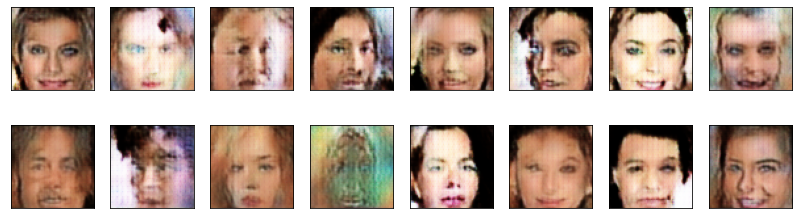

2024-08-05 23:22:57 | Ep [18/50] | Bch 0/509 | d_lss: -0.2357 | g_lss: 0.2454
2024-08-05 23:23:06 | Ep [18/50] | Bch 50/509 | d_lss: -0.1418 | g_lss: 0.9305
2024-08-05 23:23:14 | Ep [18/50] | Bch 100/509 | d_lss: -0.1949 | g_lss: -0.7152
2024-08-05 23:23:23 | Ep [18/50] | Bch 150/509 | d_lss: -0.2500 | g_lss: -0.4724
2024-08-05 23:23:31 | Ep [18/50] | Bch 200/509 | d_lss: -0.1150 | g_lss: -0.9707
2024-08-05 23:23:40 | Ep [18/50] | Bch 250/509 | d_lss: 0.2419 | g_lss: 0.7692
2024-08-05 23:23:49 | Ep [18/50] | Bch 300/509 | d_lss: -0.2621 | g_lss: -0.1257
2024-08-05 23:23:57 | Ep [18/50] | Bch 350/509 | d_lss: -0.2623 | g_lss: 0.3038
2024-08-05 23:24:06 | Ep [18/50] | Bch 400/509 | d_lss: -0.2819 | g_lss: -0.6069
2024-08-05 23:24:14 | Ep [18/50] | Bch 450/509 | d_lss: -0.2246 | g_lss: 2.4219
2024-08-05 23:24:22 | Ep [18/50] | Bch 500/509 | d_lss: -0.0280 | g_lss: 0.5585


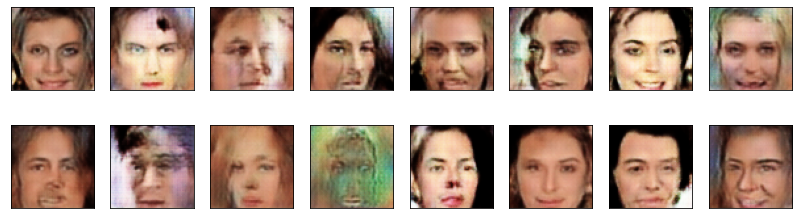

2024-08-05 23:24:28 | Ep [19/50] | Bch 0/509 | d_lss: -0.1984 | g_lss: -1.0949
2024-08-05 23:24:36 | Ep [19/50] | Bch 50/509 | d_lss: -0.1984 | g_lss: -1.0548
2024-08-05 23:24:45 | Ep [19/50] | Bch 100/509 | d_lss: 0.0641 | g_lss: -0.9685
2024-08-05 23:24:53 | Ep [19/50] | Bch 150/509 | d_lss: -0.2024 | g_lss: -0.2719
2024-08-05 23:25:02 | Ep [19/50] | Bch 200/509 | d_lss: -0.1321 | g_lss: -0.3592
2024-08-05 23:25:10 | Ep [19/50] | Bch 250/509 | d_lss: 0.0815 | g_lss: -1.3878
2024-08-05 23:25:19 | Ep [19/50] | Bch 300/509 | d_lss: -0.2086 | g_lss: 0.6503
2024-08-05 23:25:27 | Ep [19/50] | Bch 350/509 | d_lss: -0.1648 | g_lss: -0.6659
2024-08-05 23:25:36 | Ep [19/50] | Bch 400/509 | d_lss: -0.2655 | g_lss: 1.6795
2024-08-05 23:25:44 | Ep [19/50] | Bch 450/509 | d_lss: -0.0052 | g_lss: 1.1826
2024-08-05 23:25:53 | Ep [19/50] | Bch 500/509 | d_lss: -0.0733 | g_lss: -1.7872


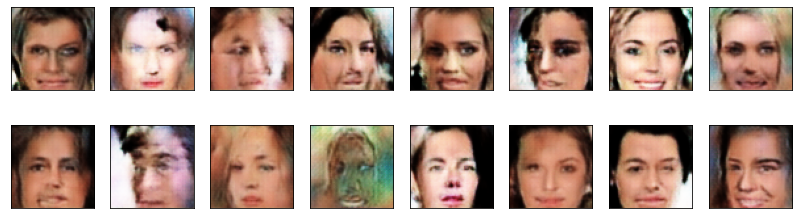

2024-08-05 23:25:58 | Ep [20/50] | Bch 0/509 | d_lss: -0.2832 | g_lss: 0.6902
2024-08-05 23:26:06 | Ep [20/50] | Bch 50/509 | d_lss: -0.1689 | g_lss: 0.3543
2024-08-05 23:26:15 | Ep [20/50] | Bch 100/509 | d_lss: -0.2333 | g_lss: -0.3565
2024-08-05 23:26:23 | Ep [20/50] | Bch 150/509 | d_lss: -0.1312 | g_lss: -0.5344
2024-08-05 23:26:32 | Ep [20/50] | Bch 200/509 | d_lss: -0.0497 | g_lss: 1.7307
2024-08-05 23:26:40 | Ep [20/50] | Bch 250/509 | d_lss: -0.1894 | g_lss: 1.1210
2024-08-05 23:26:49 | Ep [20/50] | Bch 300/509 | d_lss: -0.1541 | g_lss: -0.9404
2024-08-05 23:26:57 | Ep [20/50] | Bch 350/509 | d_lss: -0.2178 | g_lss: 0.3936
2024-08-05 23:27:06 | Ep [20/50] | Bch 400/509 | d_lss: -0.1265 | g_lss: 0.2771
2024-08-05 23:27:14 | Ep [20/50] | Bch 450/509 | d_lss: -0.1269 | g_lss: 1.0618
2024-08-05 23:27:23 | Ep [20/50] | Bch 500/509 | d_lss: -0.2312 | g_lss: -0.6966


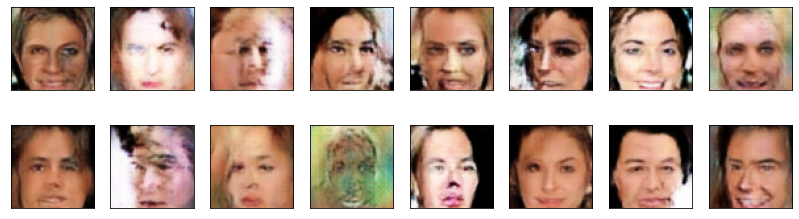

2024-08-05 23:27:28 | Ep [21/50] | Bch 0/509 | d_lss: -0.0430 | g_lss: 1.4310
2024-08-05 23:27:36 | Ep [21/50] | Bch 50/509 | d_lss: -0.0949 | g_lss: -0.8208
2024-08-05 23:27:45 | Ep [21/50] | Bch 100/509 | d_lss: 1.3742 | g_lss: 0.0553
2024-08-05 23:27:53 | Ep [21/50] | Bch 150/509 | d_lss: -0.0431 | g_lss: 1.3307
2024-08-05 23:28:02 | Ep [21/50] | Bch 200/509 | d_lss: -0.1544 | g_lss: -0.4894
2024-08-05 23:28:10 | Ep [21/50] | Bch 250/509 | d_lss: -0.0854 | g_lss: -0.4648
2024-08-05 23:28:19 | Ep [21/50] | Bch 300/509 | d_lss: -0.1211 | g_lss: 0.5539
2024-08-05 23:28:27 | Ep [21/50] | Bch 350/509 | d_lss: 0.0913 | g_lss: -1.9286
2024-08-05 23:28:36 | Ep [21/50] | Bch 400/509 | d_lss: -0.1931 | g_lss: 2.0176
2024-08-05 23:28:44 | Ep [21/50] | Bch 450/509 | d_lss: -0.2155 | g_lss: 0.1975
2024-08-05 23:28:52 | Ep [21/50] | Bch 500/509 | d_lss: -0.0484 | g_lss: -0.0203


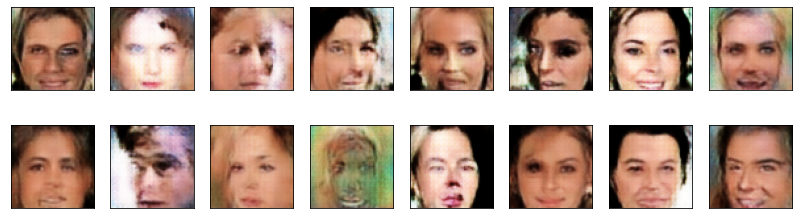

2024-08-05 23:28:58 | Ep [22/50] | Bch 0/509 | d_lss: -0.1057 | g_lss: -0.7354
2024-08-05 23:29:07 | Ep [22/50] | Bch 50/509 | d_lss: -0.2091 | g_lss: 0.9648
2024-08-05 23:29:15 | Ep [22/50] | Bch 100/509 | d_lss: -0.2439 | g_lss: -0.5033
2024-08-05 23:29:24 | Ep [22/50] | Bch 150/509 | d_lss: -0.1747 | g_lss: -0.3328
2024-08-05 23:29:32 | Ep [22/50] | Bch 200/509 | d_lss: -0.1065 | g_lss: -0.7643
2024-08-05 23:29:41 | Ep [22/50] | Bch 250/509 | d_lss: -0.1815 | g_lss: -0.9726
2024-08-05 23:29:50 | Ep [22/50] | Bch 300/509 | d_lss: 0.1400 | g_lss: -1.7779
2024-08-05 23:29:58 | Ep [22/50] | Bch 350/509 | d_lss: -0.0246 | g_lss: 0.5266
2024-08-05 23:30:07 | Ep [22/50] | Bch 400/509 | d_lss: -0.1514 | g_lss: 0.3284
2024-08-05 23:30:15 | Ep [22/50] | Bch 450/509 | d_lss: -0.1460 | g_lss: -0.0146
2024-08-05 23:30:23 | Ep [22/50] | Bch 500/509 | d_lss: -0.1974 | g_lss: -0.1626


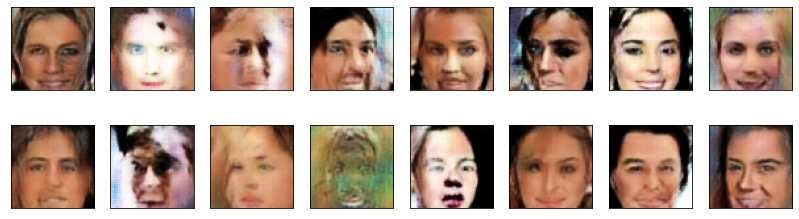

2024-08-05 23:30:28 | Ep [23/50] | Bch 0/509 | d_lss: 0.0192 | g_lss: -0.5515
2024-08-05 23:30:37 | Ep [23/50] | Bch 50/509 | d_lss: -0.2526 | g_lss: 1.5898
2024-08-05 23:30:45 | Ep [23/50] | Bch 100/509 | d_lss: -0.1560 | g_lss: -0.0711
2024-08-05 23:30:54 | Ep [23/50] | Bch 150/509 | d_lss: -0.0935 | g_lss: 0.2925
2024-08-05 23:31:02 | Ep [23/50] | Bch 200/509 | d_lss: 0.0321 | g_lss: -1.0601
2024-08-05 23:31:11 | Ep [23/50] | Bch 250/509 | d_lss: -0.0625 | g_lss: -0.2743
2024-08-05 23:31:19 | Ep [23/50] | Bch 300/509 | d_lss: -0.1191 | g_lss: 0.1301
2024-08-05 23:31:28 | Ep [23/50] | Bch 350/509 | d_lss: -0.2404 | g_lss: -1.0213
2024-08-05 23:31:36 | Ep [23/50] | Bch 400/509 | d_lss: 0.0303 | g_lss: 1.6347
2024-08-05 23:31:45 | Ep [23/50] | Bch 450/509 | d_lss: -0.1488 | g_lss: 0.4747
2024-08-05 23:31:53 | Ep [23/50] | Bch 500/509 | d_lss: -0.0630 | g_lss: 0.4654


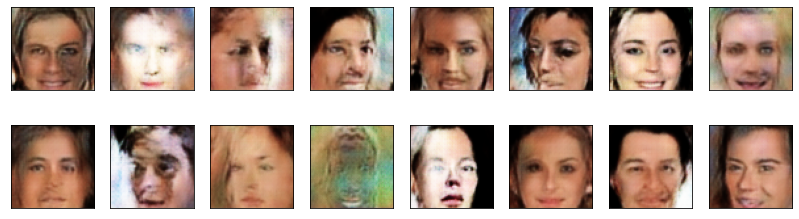

2024-08-05 23:31:58 | Ep [24/50] | Bch 0/509 | d_lss: -0.1196 | g_lss: -0.7587
2024-08-05 23:32:07 | Ep [24/50] | Bch 50/509 | d_lss: -0.1579 | g_lss: -1.2908
2024-08-05 23:32:15 | Ep [24/50] | Bch 100/509 | d_lss: -0.1082 | g_lss: -1.0622
2024-08-05 23:32:24 | Ep [24/50] | Bch 150/509 | d_lss: -0.1594 | g_lss: -0.5216
2024-08-05 23:32:33 | Ep [24/50] | Bch 200/509 | d_lss: 0.1721 | g_lss: -2.2274
2024-08-05 23:32:41 | Ep [24/50] | Bch 250/509 | d_lss: -0.1095 | g_lss: -1.6089
2024-08-05 23:33:15 | Ep [24/50] | Bch 450/509 | d_lss: -0.0878 | g_lss: -0.6061
2024-08-05 23:33:23 | Ep [24/50] | Bch 500/509 | d_lss: -0.1212 | g_lss: 0.6571


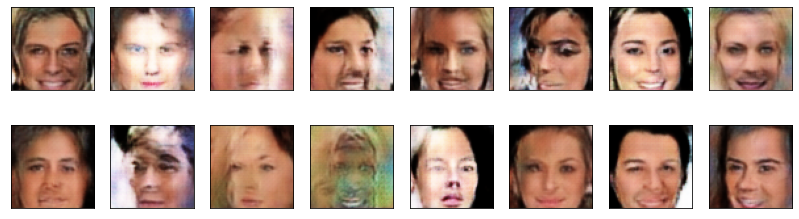

2024-08-05 23:33:28 | Ep [25/50] | Bch 0/509 | d_lss: -0.0627 | g_lss: -0.5609
2024-08-05 23:33:37 | Ep [25/50] | Bch 50/509 | d_lss: -0.0526 | g_lss: -0.6184
2024-08-05 23:33:45 | Ep [25/50] | Bch 100/509 | d_lss: 0.0213 | g_lss: -0.1462
2024-08-05 23:33:54 | Ep [25/50] | Bch 150/509 | d_lss: -0.2818 | g_lss: -0.2754
2024-08-05 23:34:02 | Ep [25/50] | Bch 200/509 | d_lss: -0.0339 | g_lss: -0.5244
2024-08-05 23:34:11 | Ep [25/50] | Bch 250/509 | d_lss: -0.1434 | g_lss: 0.2032
2024-08-05 23:34:19 | Ep [25/50] | Bch 300/509 | d_lss: -0.1145 | g_lss: -1.0545
2024-08-05 23:34:28 | Ep [25/50] | Bch 350/509 | d_lss: -0.2083 | g_lss: 0.6947
2024-08-05 23:34:36 | Ep [25/50] | Bch 400/509 | d_lss: -0.2717 | g_lss: 1.2432
2024-08-05 23:34:45 | Ep [25/50] | Bch 450/509 | d_lss: -0.0844 | g_lss: 1.0393
2024-08-05 23:34:53 | Ep [25/50] | Bch 500/509 | d_lss: -0.1331 | g_lss: 1.8774


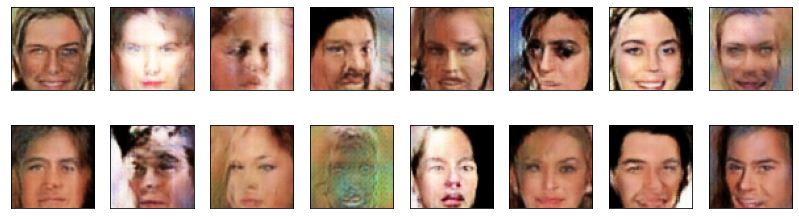

2024-08-05 23:34:58 | Ep [26/50] | Bch 0/509 | d_lss: -0.0736 | g_lss: -0.4376
2024-08-05 23:35:06 | Ep [26/50] | Bch 50/509 | d_lss: -0.1570 | g_lss: -0.6520
2024-08-05 23:35:15 | Ep [26/50] | Bch 100/509 | d_lss: -0.2628 | g_lss: -0.7730
2024-08-05 23:35:23 | Ep [26/50] | Bch 150/509 | d_lss: -0.1642 | g_lss: -0.9775
2024-08-05 23:35:32 | Ep [26/50] | Bch 200/509 | d_lss: -0.1431 | g_lss: 1.0801
2024-08-05 23:35:41 | Ep [26/50] | Bch 250/509 | d_lss: -0.0955 | g_lss: -0.0346
2024-08-05 23:35:49 | Ep [26/50] | Bch 300/509 | d_lss: -0.1558 | g_lss: -0.1364
2024-08-05 23:35:58 | Ep [26/50] | Bch 350/509 | d_lss: -0.1260 | g_lss: -0.6730
2024-08-05 23:36:06 | Ep [26/50] | Bch 400/509 | d_lss: -0.1365 | g_lss: -1.5098
2024-08-05 23:36:14 | Ep [26/50] | Bch 450/509 | d_lss: -0.1862 | g_lss: -0.7652
2024-08-05 23:36:23 | Ep [26/50] | Bch 500/509 | d_lss: -0.1435 | g_lss: 0.3287


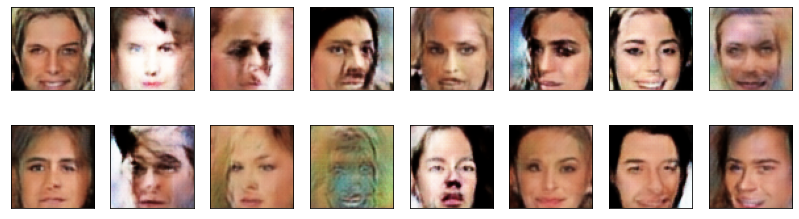

2024-08-05 23:36:27 | Ep [27/50] | Bch 0/509 | d_lss: -0.0484 | g_lss: -0.0450
2024-08-05 23:36:35 | Ep [27/50] | Bch 50/509 | d_lss: -0.1607 | g_lss: 0.5791
2024-08-05 23:36:44 | Ep [27/50] | Bch 100/509 | d_lss: -0.1299 | g_lss: 0.2927
2024-08-05 23:36:52 | Ep [27/50] | Bch 150/509 | d_lss: -0.0848 | g_lss: 0.5775
2024-08-05 23:37:01 | Ep [27/50] | Bch 200/509 | d_lss: -0.1434 | g_lss: -0.4579
2024-08-05 23:37:09 | Ep [27/50] | Bch 250/509 | d_lss: -0.0859 | g_lss: -0.9023
2024-08-05 23:37:18 | Ep [27/50] | Bch 300/509 | d_lss: 0.0406 | g_lss: -0.2893
2024-08-05 23:37:26 | Ep [27/50] | Bch 350/509 | d_lss: -0.2890 | g_lss: 1.1114
2024-08-05 23:37:35 | Ep [27/50] | Bch 400/509 | d_lss: -0.0949 | g_lss: -0.5936
2024-08-05 23:37:43 | Ep [27/50] | Bch 450/509 | d_lss: -0.1081 | g_lss: -1.9722
2024-08-05 23:37:52 | Ep [27/50] | Bch 500/509 | d_lss: -0.1027 | g_lss: 0.6128


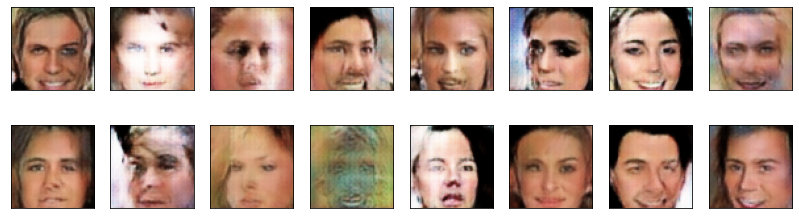

2024-08-05 23:37:57 | Ep [28/50] | Bch 0/509 | d_lss: -0.1280 | g_lss: -1.2018
2024-08-05 23:38:06 | Ep [28/50] | Bch 50/509 | d_lss: -0.0723 | g_lss: -0.5443
2024-08-05 23:38:14 | Ep [28/50] | Bch 100/509 | d_lss: -0.0405 | g_lss: 1.4609
2024-08-05 23:38:23 | Ep [28/50] | Bch 150/509 | d_lss: -0.2079 | g_lss: 1.1767
2024-08-05 23:38:32 | Ep [28/50] | Bch 200/509 | d_lss: -0.0914 | g_lss: 1.4168
2024-08-05 23:38:40 | Ep [28/50] | Bch 250/509 | d_lss: -0.0756 | g_lss: 1.9728
2024-08-05 23:38:48 | Ep [28/50] | Bch 300/509 | d_lss: -0.1796 | g_lss: 1.0707
2024-08-05 23:38:57 | Ep [28/50] | Bch 350/509 | d_lss: -0.1763 | g_lss: 0.8360
2024-08-05 23:39:05 | Ep [28/50] | Bch 400/509 | d_lss: 0.0391 | g_lss: 1.0090
2024-08-05 23:39:14 | Ep [28/50] | Bch 450/509 | d_lss: 0.0096 | g_lss: 0.9789
2024-08-05 23:39:22 | Ep [28/50] | Bch 500/509 | d_lss: -0.1802 | g_lss: 0.8941
2024-08-05 23:41:23 | Ep [30/50] | Bch 150/509 | d_lss: -0.0202 | g_lss: 0.2660
2024-08-05 23:41:31 | Ep [30/50] | Bch 200/

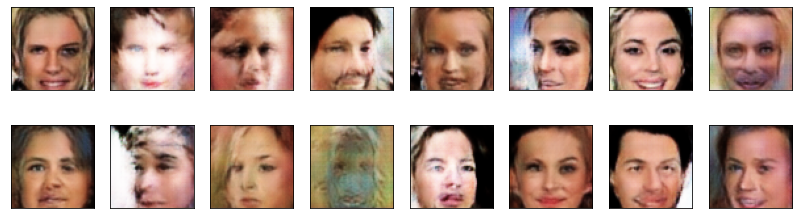

2024-08-05 23:42:27 | Ep [31/50] | Bch 0/509 | d_lss: -0.1972 | g_lss: 1.4502
2024-08-05 23:42:35 | Ep [31/50] | Bch 50/509 | d_lss: -0.1757 | g_lss: 1.4900
2024-08-05 23:42:44 | Ep [31/50] | Bch 100/509 | d_lss: 0.0015 | g_lss: 0.8132
2024-08-05 23:42:52 | Ep [31/50] | Bch 150/509 | d_lss: -0.1671 | g_lss: -1.2060
2024-08-05 23:43:01 | Ep [31/50] | Bch 200/509 | d_lss: -0.1408 | g_lss: 0.3428
2024-08-05 23:43:09 | Ep [31/50] | Bch 250/509 | d_lss: -0.0504 | g_lss: 0.2186
2024-08-05 23:43:18 | Ep [31/50] | Bch 300/509 | d_lss: -0.2736 | g_lss: -0.5217
2024-08-05 23:43:26 | Ep [31/50] | Bch 350/509 | d_lss: -0.1301 | g_lss: 0.2774
2024-08-05 23:43:35 | Ep [31/50] | Bch 400/509 | d_lss: -0.1130 | g_lss: 0.5657
2024-08-05 23:43:43 | Ep [31/50] | Bch 450/509 | d_lss: -0.0961 | g_lss: 1.2845
2024-08-05 23:43:51 | Ep [31/50] | Bch 500/509 | d_lss: -0.0859 | g_lss: 0.7949


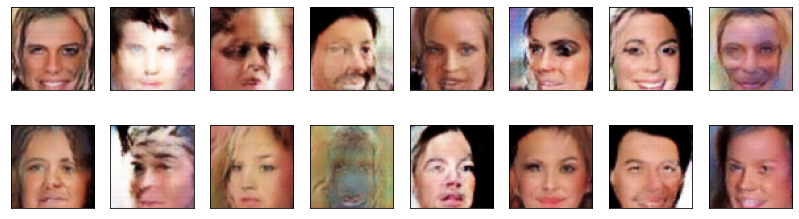

2024-08-05 23:43:56 | Ep [32/50] | Bch 0/509 | d_lss: -0.0997 | g_lss: -0.9707
2024-08-05 23:44:05 | Ep [32/50] | Bch 50/509 | d_lss: -0.1257 | g_lss: 1.0785
2024-08-05 23:44:13 | Ep [32/50] | Bch 100/509 | d_lss: -0.1638 | g_lss: 0.4381
2024-08-05 23:44:22 | Ep [32/50] | Bch 150/509 | d_lss: 0.0014 | g_lss: 0.0471
2024-08-05 23:44:30 | Ep [32/50] | Bch 200/509 | d_lss: -0.2033 | g_lss: -0.4773
2024-08-05 23:44:39 | Ep [32/50] | Bch 250/509 | d_lss: 0.0843 | g_lss: -1.4451
2024-08-05 23:44:47 | Ep [32/50] | Bch 300/509 | d_lss: -0.1001 | g_lss: 0.2845
2024-08-05 23:44:55 | Ep [32/50] | Bch 350/509 | d_lss: -0.1133 | g_lss: 1.6933
2024-08-05 23:45:04 | Ep [32/50] | Bch 400/509 | d_lss: -0.2011 | g_lss: 0.5810
2024-08-05 23:45:12 | Ep [32/50] | Bch 450/509 | d_lss: -0.1446 | g_lss: 0.3313
2024-08-05 23:45:21 | Ep [32/50] | Bch 500/509 | d_lss: -0.0531 | g_lss: 1.0243


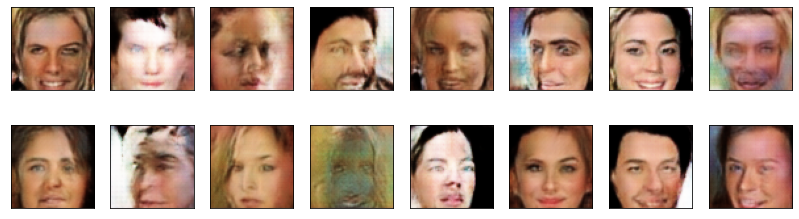

2024-08-05 23:45:26 | Ep [33/50] | Bch 0/509 | d_lss: -0.0505 | g_lss: 1.2542
2024-08-05 23:45:34 | Ep [33/50] | Bch 50/509 | d_lss: -0.1688 | g_lss: 0.9199
2024-08-05 23:45:42 | Ep [33/50] | Bch 100/509 | d_lss: 0.0546 | g_lss: 0.5983
2024-08-05 23:45:51 | Ep [33/50] | Bch 150/509 | d_lss: -0.0852 | g_lss: 0.7126
2024-08-05 23:46:00 | Ep [33/50] | Bch 200/509 | d_lss: -0.2239 | g_lss: 1.7303
2024-08-05 23:46:08 | Ep [33/50] | Bch 250/509 | d_lss: -0.0171 | g_lss: 0.1067
2024-08-05 23:46:16 | Ep [33/50] | Bch 300/509 | d_lss: -0.0774 | g_lss: 0.3383
2024-08-05 23:46:25 | Ep [33/50] | Bch 350/509 | d_lss: -0.1250 | g_lss: -0.7003
2024-08-05 23:46:33 | Ep [33/50] | Bch 400/509 | d_lss: -0.0519 | g_lss: -1.9616
2024-08-05 23:46:42 | Ep [33/50] | Bch 450/509 | d_lss: -0.1425 | g_lss: -0.3076
2024-08-05 23:46:50 | Ep [33/50] | Bch 500/509 | d_lss: -0.1404 | g_lss: -1.0069


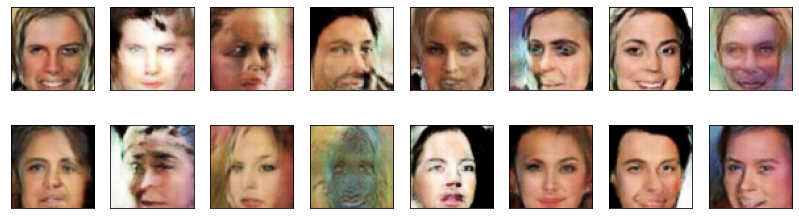

2024-08-05 23:46:56 | Ep [34/50] | Bch 0/509 | d_lss: -0.1295 | g_lss: -0.3743
2024-08-05 23:47:04 | Ep [34/50] | Bch 50/509 | d_lss: -0.1388 | g_lss: -0.7282
2024-08-05 23:47:12 | Ep [34/50] | Bch 100/509 | d_lss: -0.2246 | g_lss: 0.1254
2024-08-05 23:47:21 | Ep [34/50] | Bch 150/509 | d_lss: -0.0834 | g_lss: 0.5263
2024-08-05 23:47:30 | Ep [34/50] | Bch 200/509 | d_lss: -0.1988 | g_lss: 0.0001
2024-08-05 23:47:38 | Ep [34/50] | Bch 250/509 | d_lss: -0.0911 | g_lss: 0.2075
2024-08-05 23:47:47 | Ep [34/50] | Bch 300/509 | d_lss: -0.1382 | g_lss: 1.2545
2024-08-05 23:47:55 | Ep [34/50] | Bch 350/509 | d_lss: -0.1032 | g_lss: 0.5613
2024-08-05 23:48:04 | Ep [34/50] | Bch 400/509 | d_lss: -0.0527 | g_lss: 0.0582
2024-08-05 23:48:12 | Ep [34/50] | Bch 450/509 | d_lss: -0.0520 | g_lss: -0.5168
2024-08-05 23:48:20 | Ep [34/50] | Bch 500/509 | d_lss: 0.0549 | g_lss: -1.1260
2024-08-05 23:50:20 | Ep [36/50] | Bch 150/509 | d_lss: -0.1956 | g_lss: -0.0244
2024-08-05 23:50:29 | Ep [36/50] | Bch 

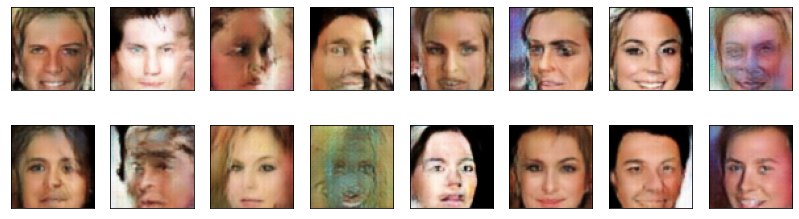

2024-08-05 23:51:26 | Ep [37/50] | Bch 0/509 | d_lss: -0.0986 | g_lss: -0.5845
2024-08-05 23:51:34 | Ep [37/50] | Bch 50/509 | d_lss: -0.2163 | g_lss: -0.8393
2024-08-05 23:51:42 | Ep [37/50] | Bch 100/509 | d_lss: -0.2122 | g_lss: -1.5088
2024-08-05 23:51:51 | Ep [37/50] | Bch 150/509 | d_lss: -0.0547 | g_lss: -1.5515
2024-08-05 23:52:00 | Ep [37/50] | Bch 200/509 | d_lss: -0.1365 | g_lss: -0.6242
2024-08-05 23:52:08 | Ep [37/50] | Bch 250/509 | d_lss: -0.1733 | g_lss: 0.6356
2024-08-05 23:52:16 | Ep [37/50] | Bch 300/509 | d_lss: 0.0221 | g_lss: 0.2444
2024-08-05 23:52:25 | Ep [37/50] | Bch 350/509 | d_lss: -0.0906 | g_lss: 0.1006
2024-08-05 23:52:33 | Ep [37/50] | Bch 400/509 | d_lss: -0.1508 | g_lss: -0.5226
2024-08-05 23:52:42 | Ep [37/50] | Bch 450/509 | d_lss: -0.1197 | g_lss: -0.8729
2024-08-05 23:52:50 | Ep [37/50] | Bch 500/509 | d_lss: -0.1074 | g_lss: -0.8746


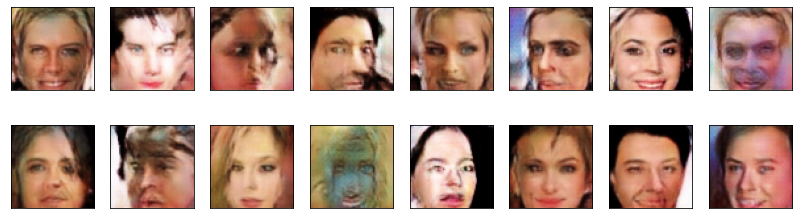

2024-08-05 23:52:55 | Ep [38/50] | Bch 0/509 | d_lss: -0.1131 | g_lss: 2.3617
2024-08-05 23:53:04 | Ep [38/50] | Bch 50/509 | d_lss: -0.1096 | g_lss: -0.5348
2024-08-05 23:53:12 | Ep [38/50] | Bch 100/509 | d_lss: 0.0478 | g_lss: -0.6217
2024-08-05 23:53:21 | Ep [38/50] | Bch 150/509 | d_lss: -0.0409 | g_lss: 0.0832
2024-08-05 23:53:29 | Ep [38/50] | Bch 200/509 | d_lss: 0.0769 | g_lss: 0.8795
2024-08-05 23:53:38 | Ep [38/50] | Bch 250/509 | d_lss: -0.1636 | g_lss: -0.4781
2024-08-05 23:53:47 | Ep [38/50] | Bch 300/509 | d_lss: 0.0144 | g_lss: -0.3532
2024-08-05 23:53:55 | Ep [38/50] | Bch 350/509 | d_lss: -0.1587 | g_lss: -0.0705
2024-08-05 23:54:04 | Ep [38/50] | Bch 400/509 | d_lss: -0.0659 | g_lss: -0.4962
2024-08-05 23:54:12 | Ep [38/50] | Bch 450/509 | d_lss: -0.1522 | g_lss: 0.6549
2024-08-05 23:54:20 | Ep [38/50] | Bch 500/509 | d_lss: -0.2065 | g_lss: 1.3611


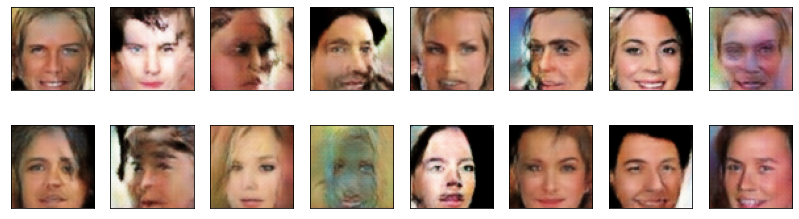

2024-08-05 23:54:27 | Ep [39/50] | Bch 0/509 | d_lss: -0.1466 | g_lss: -0.2640
2024-08-05 23:54:35 | Ep [39/50] | Bch 50/509 | d_lss: -0.1513 | g_lss: -0.2165
2024-08-05 23:54:44 | Ep [39/50] | Bch 100/509 | d_lss: -0.1403 | g_lss: 0.0453
2024-08-05 23:54:52 | Ep [39/50] | Bch 150/509 | d_lss: -0.1603 | g_lss: -0.6491
2024-08-05 23:55:01 | Ep [39/50] | Bch 200/509 | d_lss: -0.2041 | g_lss: -0.7224
2024-08-05 23:55:09 | Ep [39/50] | Bch 250/509 | d_lss: -0.0780 | g_lss: 0.6240
2024-08-05 23:55:18 | Ep [39/50] | Bch 300/509 | d_lss: -0.2015 | g_lss: 1.2042
2024-08-05 23:55:26 | Ep [39/50] | Bch 350/509 | d_lss: -0.2538 | g_lss: -0.0663
2024-08-05 23:55:34 | Ep [39/50] | Bch 400/509 | d_lss: -0.1118 | g_lss: -0.6650
2024-08-05 23:55:43 | Ep [39/50] | Bch 450/509 | d_lss: -0.1102 | g_lss: -0.9315
2024-08-05 23:55:51 | Ep [39/50] | Bch 500/509 | d_lss: -0.1410 | g_lss: 0.4043


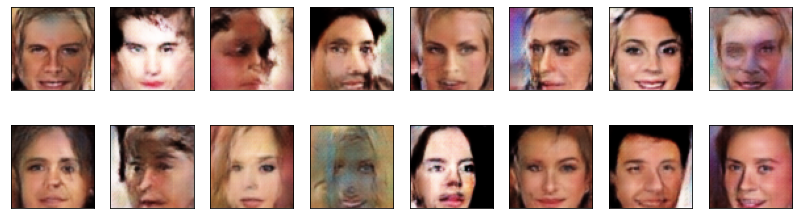

2024-08-05 23:55:57 | Ep [40/50] | Bch 0/509 | d_lss: -0.0149 | g_lss: 1.5100
2024-08-05 23:56:05 | Ep [40/50] | Bch 50/509 | d_lss: -0.1078 | g_lss: -0.6082
2024-08-05 23:56:13 | Ep [40/50] | Bch 100/509 | d_lss: -0.1157 | g_lss: 0.1291
2024-08-05 23:56:22 | Ep [40/50] | Bch 150/509 | d_lss: -0.1626 | g_lss: 1.3111
2024-08-05 23:56:30 | Ep [40/50] | Bch 200/509 | d_lss: -0.0787 | g_lss: 0.2099
2024-08-05 23:56:39 | Ep [40/50] | Bch 250/509 | d_lss: -0.1417 | g_lss: -0.0569
2024-08-05 23:56:47 | Ep [40/50] | Bch 300/509 | d_lss: -0.1124 | g_lss: 0.7861
2024-08-05 23:56:56 | Ep [40/50] | Bch 350/509 | d_lss: -0.1204 | g_lss: 1.0051
2024-08-05 23:57:04 | Ep [40/50] | Bch 400/509 | d_lss: -0.0906 | g_lss: 0.1071
2024-08-05 23:57:13 | Ep [40/50] | Bch 450/509 | d_lss: -0.0913 | g_lss: 1.6807
2024-08-05 23:57:21 | Ep [40/50] | Bch 500/509 | d_lss: -0.1199 | g_lss: -1.6182


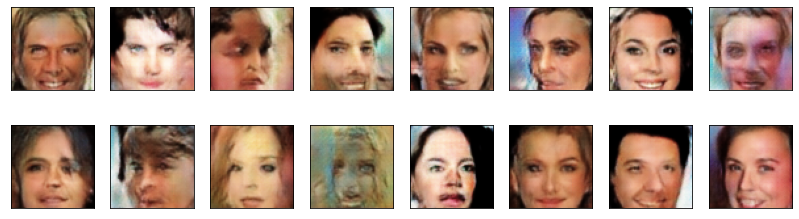

2024-08-05 23:57:26 | Ep [41/50] | Bch 0/509 | d_lss: -0.0960 | g_lss: 2.1812
2024-08-05 23:57:35 | Ep [41/50] | Bch 50/509 | d_lss: 0.0023 | g_lss: -0.6822
2024-08-05 23:57:43 | Ep [41/50] | Bch 100/509 | d_lss: -0.0783 | g_lss: 1.6568
2024-08-05 23:57:52 | Ep [41/50] | Bch 150/509 | d_lss: -0.0916 | g_lss: 0.9747
2024-08-05 23:58:00 | Ep [41/50] | Bch 200/509 | d_lss: -0.2552 | g_lss: -0.8426
2024-08-05 23:58:09 | Ep [41/50] | Bch 250/509 | d_lss: -0.0940 | g_lss: -1.1557
2024-08-05 23:58:17 | Ep [41/50] | Bch 300/509 | d_lss: -0.1699 | g_lss: 0.9858
2024-08-05 23:58:26 | Ep [41/50] | Bch 350/509 | d_lss: -0.0979 | g_lss: 0.2809
2024-08-05 23:58:34 | Ep [41/50] | Bch 400/509 | d_lss: -0.0872 | g_lss: -0.0067
2024-08-05 23:58:43 | Ep [41/50] | Bch 450/509 | d_lss: 0.0155 | g_lss: 0.3557
2024-08-05 23:58:51 | Ep [41/50] | Bch 500/509 | d_lss: -0.1037 | g_lss: 0.4875
2024-08-06 00:00:44 | Ep [43/50] | Bch 100/509 | d_lss: -0.0387 | g_lss: 0.7481
2024-08-06 00:00:52 | Ep [43/50] | Bch 15

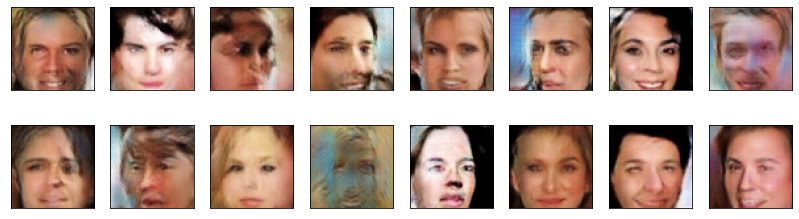

2024-08-06 00:01:56 | Ep [44/50] | Bch 0/509 | d_lss: -0.2133 | g_lss: -1.2898
2024-08-06 00:02:04 | Ep [44/50] | Bch 50/509 | d_lss: -0.1826 | g_lss: -0.4286
2024-08-06 00:02:13 | Ep [44/50] | Bch 100/509 | d_lss: 0.2702 | g_lss: 0.6860
2024-08-06 00:02:21 | Ep [44/50] | Bch 150/509 | d_lss: -0.1224 | g_lss: -0.1115
2024-08-06 00:02:30 | Ep [44/50] | Bch 200/509 | d_lss: -0.0799 | g_lss: 0.6977
2024-08-06 00:02:38 | Ep [44/50] | Bch 250/509 | d_lss: -0.0076 | g_lss: 0.9491
2024-08-06 00:02:46 | Ep [44/50] | Bch 300/509 | d_lss: -0.1257 | g_lss: 0.5563
2024-08-06 00:02:55 | Ep [44/50] | Bch 350/509 | d_lss: -0.0338 | g_lss: -0.6763
2024-08-06 00:03:04 | Ep [44/50] | Bch 400/509 | d_lss: -0.2495 | g_lss: -1.0636
2024-08-06 00:03:12 | Ep [44/50] | Bch 450/509 | d_lss: -0.1234 | g_lss: 0.4144
2024-08-06 00:03:20 | Ep [44/50] | Bch 500/509 | d_lss: -0.1455 | g_lss: 0.3269


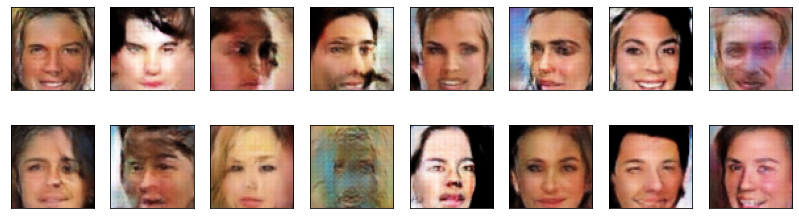

2024-08-06 00:03:26 | Ep [45/50] | Bch 0/509 | d_lss: -0.0919 | g_lss: -0.8365
2024-08-06 00:03:34 | Ep [45/50] | Bch 50/509 | d_lss: -0.0693 | g_lss: 1.7172
2024-08-06 00:03:43 | Ep [45/50] | Bch 100/509 | d_lss: -0.0601 | g_lss: 0.9079
2024-08-06 00:03:51 | Ep [45/50] | Bch 150/509 | d_lss: -0.0802 | g_lss: -0.1357
2024-08-06 00:04:00 | Ep [45/50] | Bch 200/509 | d_lss: -0.1467 | g_lss: -0.1813
2024-08-06 00:04:08 | Ep [45/50] | Bch 250/509 | d_lss: -0.1494 | g_lss: -1.8045
2024-08-06 00:04:17 | Ep [45/50] | Bch 300/509 | d_lss: -0.1025 | g_lss: 0.2232
2024-08-06 00:04:25 | Ep [45/50] | Bch 350/509 | d_lss: -0.1462 | g_lss: -0.3008
2024-08-06 00:04:34 | Ep [45/50] | Bch 400/509 | d_lss: -0.0081 | g_lss: -0.3696
2024-08-06 00:04:42 | Ep [45/50] | Bch 450/509 | d_lss: -0.2411 | g_lss: 1.3048
2024-08-06 00:04:50 | Ep [45/50] | Bch 500/509 | d_lss: 0.0368 | g_lss: -1.7443


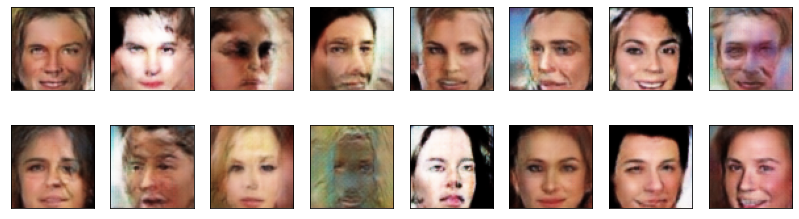

2024-08-06 00:04:56 | Ep [46/50] | Bch 0/509 | d_lss: 0.0161 | g_lss: -0.6441
2024-08-06 00:05:05 | Ep [46/50] | Bch 50/509 | d_lss: -0.1398 | g_lss: -0.1507
2024-08-06 00:05:14 | Ep [46/50] | Bch 100/509 | d_lss: -0.1607 | g_lss: -0.4983
2024-08-06 00:05:22 | Ep [46/50] | Bch 150/509 | d_lss: -0.0552 | g_lss: 0.1868
2024-08-06 00:05:31 | Ep [46/50] | Bch 200/509 | d_lss: 0.0688 | g_lss: 0.8998
2024-08-06 00:05:39 | Ep [46/50] | Bch 250/509 | d_lss: -0.1583 | g_lss: -1.6533
2024-08-06 00:05:48 | Ep [46/50] | Bch 300/509 | d_lss: -0.0770 | g_lss: -1.3235
2024-08-06 00:05:56 | Ep [46/50] | Bch 350/509 | d_lss: 0.0192 | g_lss: -0.1332
2024-08-06 00:06:05 | Ep [46/50] | Bch 400/509 | d_lss: -0.2581 | g_lss: -0.9913
2024-08-06 00:06:13 | Ep [46/50] | Bch 450/509 | d_lss: -0.0138 | g_lss: 0.7234
2024-08-06 00:06:22 | Ep [46/50] | Bch 500/509 | d_lss: -0.1573 | g_lss: -1.6546


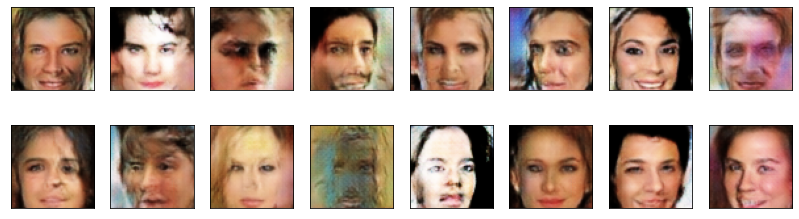

2024-08-06 00:06:28 | Ep [47/50] | Bch 0/509 | d_lss: -0.0480 | g_lss: 0.1403
2024-08-06 00:06:36 | Ep [47/50] | Bch 50/509 | d_lss: 0.0768 | g_lss: -1.4675
2024-08-06 00:06:44 | Ep [47/50] | Bch 100/509 | d_lss: -0.0073 | g_lss: 0.6491
2024-08-06 00:06:53 | Ep [47/50] | Bch 150/509 | d_lss: -0.0366 | g_lss: 0.0207
2024-08-06 00:07:02 | Ep [47/50] | Bch 200/509 | d_lss: -0.0703 | g_lss: -0.9745
2024-08-06 00:07:10 | Ep [47/50] | Bch 250/509 | d_lss: 0.0445 | g_lss: 1.1597
2024-08-06 00:07:19 | Ep [47/50] | Bch 300/509 | d_lss: -0.0856 | g_lss: 0.5081
2024-08-06 00:07:27 | Ep [47/50] | Bch 350/509 | d_lss: -0.0934 | g_lss: -0.6618
2024-08-06 00:07:36 | Ep [47/50] | Bch 400/509 | d_lss: -0.1422 | g_lss: -0.2144
2024-08-06 00:07:44 | Ep [47/50] | Bch 450/509 | d_lss: -0.1897 | g_lss: -0.8277
2024-08-06 00:07:53 | Ep [47/50] | Bch 500/509 | d_lss: -0.0251 | g_lss: 0.5783


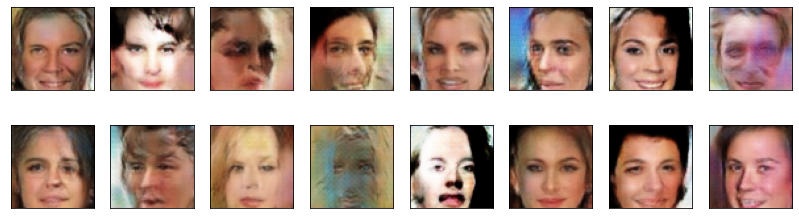

2024-08-06 00:07:58 | Ep [48/50] | Bch 0/509 | d_lss: -0.2491 | g_lss: -1.5806
2024-08-06 00:08:06 | Ep [48/50] | Bch 50/509 | d_lss: -0.1544 | g_lss: -0.9620
2024-08-06 00:08:15 | Ep [48/50] | Bch 100/509 | d_lss: -0.1286 | g_lss: -0.4598
2024-08-06 00:08:23 | Ep [48/50] | Bch 150/509 | d_lss: 0.0731 | g_lss: 0.6820
2024-08-06 00:08:32 | Ep [48/50] | Bch 200/509 | d_lss: -0.0542 | g_lss: -0.7081
2024-08-06 00:08:40 | Ep [48/50] | Bch 250/509 | d_lss: -0.2882 | g_lss: -1.3059
2024-08-06 00:08:49 | Ep [48/50] | Bch 300/509 | d_lss: -0.0547 | g_lss: -0.5174
2024-08-06 00:08:57 | Ep [48/50] | Bch 350/509 | d_lss: -0.0627 | g_lss: 0.4899
2024-08-06 00:09:06 | Ep [48/50] | Bch 400/509 | d_lss: -0.2540 | g_lss: 1.4202
2024-08-06 00:09:14 | Ep [48/50] | Bch 450/509 | d_lss: 0.0566 | g_lss: -1.6971
2024-08-06 00:09:23 | Ep [48/50] | Bch 500/509 | d_lss: -0.1106 | g_lss: 0.1237


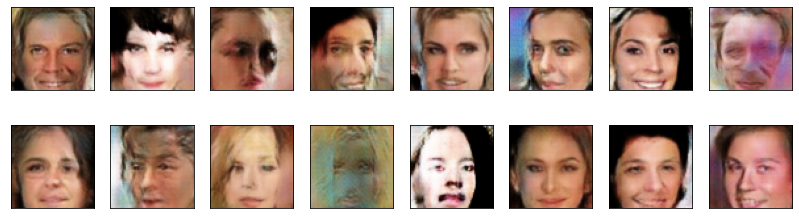

2024-08-06 00:09:29 | Ep [49/50] | Bch 0/509 | d_lss: -0.0050 | g_lss: -0.8803
2024-08-06 00:09:37 | Ep [49/50] | Bch 50/509 | d_lss: -0.0737 | g_lss: 0.5038
2024-08-06 00:09:46 | Ep [49/50] | Bch 100/509 | d_lss: -0.0693 | g_lss: -0.6220
2024-08-06 00:09:54 | Ep [49/50] | Bch 150/509 | d_lss: -0.1122 | g_lss: 0.1547
2024-08-06 00:10:03 | Ep [49/50] | Bch 200/509 | d_lss: -0.1467 | g_lss: 1.4172
2024-08-06 00:10:11 | Ep [49/50] | Bch 250/509 | d_lss: -0.1034 | g_lss: 0.2214
2024-08-06 00:10:20 | Ep [49/50] | Bch 300/509 | d_lss: -0.2136 | g_lss: -0.5370
2024-08-06 00:10:28 | Ep [49/50] | Bch 350/509 | d_lss: -0.0352 | g_lss: -0.3246
2024-08-06 00:10:36 | Ep [49/50] | Bch 400/509 | d_lss: -0.0450 | g_lss: -1.8220
2024-08-06 00:10:45 | Ep [49/50] | Bch 450/509 | d_lss: -0.0073 | g_lss: 0.0531
2024-08-06 00:10:53 | Ep [49/50] | Bch 500/509 | d_lss: -0.0502 | g_lss: -0.6825


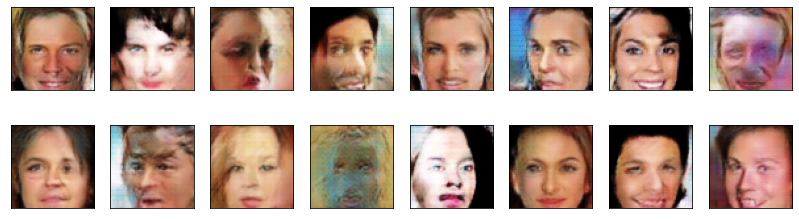

2024-08-06 00:10:59 | Ep [50/50] | Bch 0/509 | d_lss: -0.1088 | g_lss: 1.6261
2024-08-06 00:11:08 | Ep [50/50] | Bch 50/509 | d_lss: -0.0828 | g_lss: -0.0600
2024-08-06 00:11:16 | Ep [50/50] | Bch 100/509 | d_lss: 0.0083 | g_lss: 0.9418
2024-08-06 00:11:25 | Ep [50/50] | Bch 150/509 | d_lss: -0.0024 | g_lss: -1.1072
2024-08-06 00:11:34 | Ep [50/50] | Bch 200/509 | d_lss: -0.0229 | g_lss: 1.1885
2024-08-06 00:11:42 | Ep [50/50] | Bch 250/509 | d_lss: -0.1808 | g_lss: -0.0862
2024-08-06 00:11:51 | Ep [50/50] | Bch 300/509 | d_lss: 0.0654 | g_lss: -1.7906
2024-08-06 00:11:59 | Ep [50/50] | Bch 350/509 | d_lss: -0.0442 | g_lss: 1.2575
2024-08-06 00:12:08 | Ep [50/50] | Bch 400/509 | d_lss: -0.1152 | g_lss: 0.8389
2024-08-06 00:12:16 | Ep [50/50] | Bch 450/509 | d_lss: -0.0812 | g_lss: 0.6325
2024-08-06 00:12:25 | Ep [50/50] | Bch 500/509 | d_lss: -0.0534 | g_lss: -0.9861


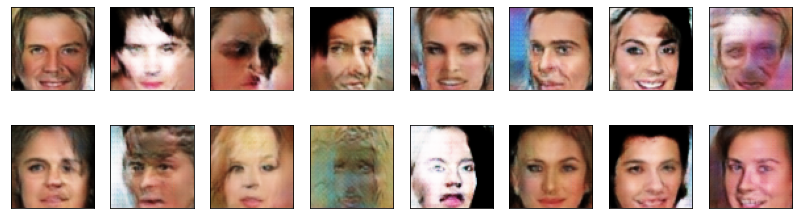

In [23]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().to(device)

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        
        ####################################
        # TODO: implement the training strategy
        # in WGAN, the discriminator is trained more frequently than generator 
        ####################################
        g_loss = generator_step(batch_size, latent_dim)
        
        real_images = real_images.to(device)
        d_loss = discriminator_step(batch_size, latent_dim, real_images)
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Ep [{epoch+1}/{n_epochs}] | Bch {batch_i}/{len(dataloader)} | d_lss: {d:.4f} | g_lss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

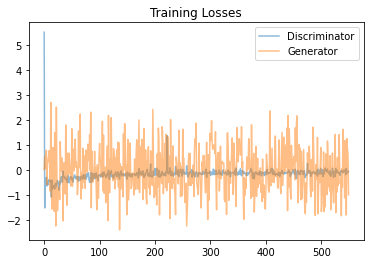

In [24]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** (Write your answer in this cell)

Observations:

Dataset bias: The dataset is predominantly white, which can result in a model that does not generalize well to other ethnicities.

Improvements:

Diversify the dataset and use more data augmentation.

Experiment with model size and regularization techniques.

Tune the optimizer and learning rate schedule.(rmsprob)

Develop custom loss functions and balance the generator and discriminator(also adding other gradient penalty  like dragan).

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.